### Cricket_Player_Analysis

### Introduction

Cricket player analysis is a comprehensive examination of a cricketer's performance, skills, and impact within the sport. It delves into batting, bowling, and fielding capabilities, considering factors such as averages, strike rates, and consistency across formats. Statistical data is scrutinized to gauge effectiveness in different conditions and against varied oppositions. Leadership qualities, fielding prowess, and psychological resilience are also assessed for their contribution to team dynamics. Through a blend of statistical metrics and qualitative observations, player analysis aims to provide insights into strengths, weaknesses, and overall influence, serving as a crucial tool for team management, strategizing, and talent development in the dynamic world of cricket.

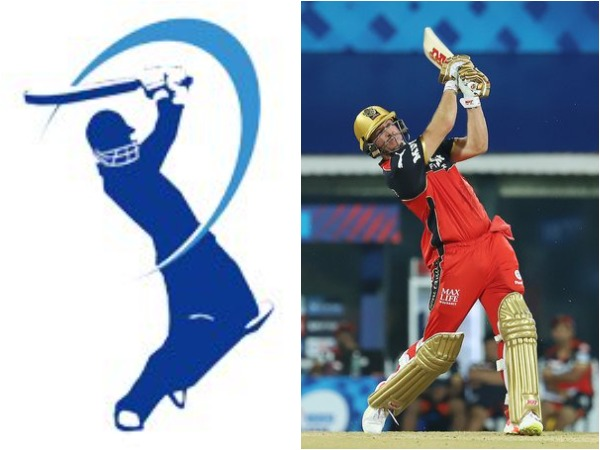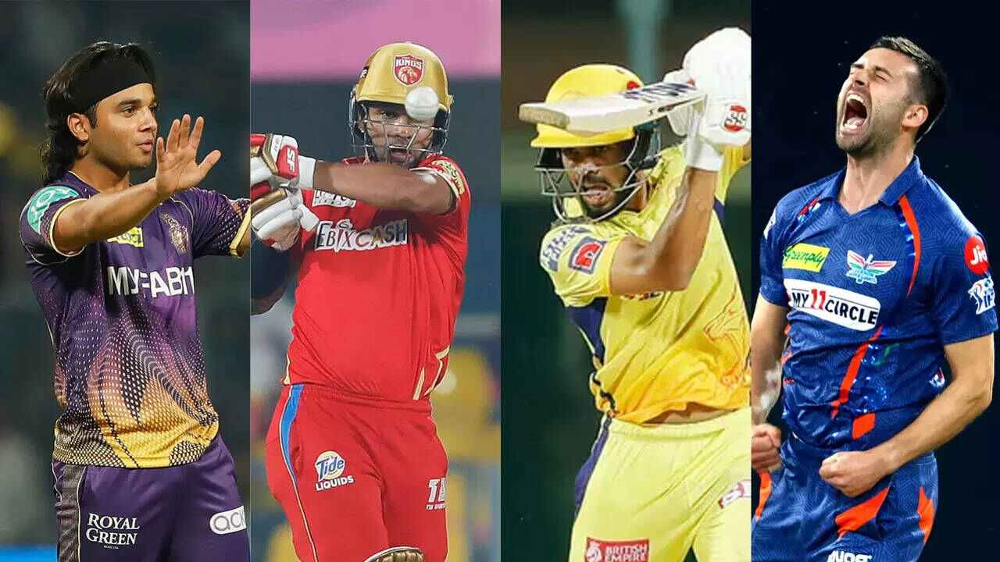

# Importing Required Libraries

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.pyplot import figure
%matplotlib inline
import seaborn as sns
import pydantic_settings
from ydata_profiling import ProfileReport
import warnings
warnings.filterwarnings('ignore')
warnings.simplefilter('ignore')

# Reading Data

In [2]:
#reading csv file
train = pd.read_csv("Training.csv",header=0)
train.head()

,Id,Runs,Boundaries,Six,Fifty,Hundred,Duck,Batting_Points,Wickets,4W_Haul,5W_Haul,Maidens,Bowling_Points,Total Points
0,1_Bipul Sharma,0,0,0,0,0,0,0,1,0,0,0,25,25
1,1_DJ Hooda,16,1,1,0,0,0,19,1,0,0,0,25,44
2,1_KM Jadhav,31,5,1,0,0,0,38,0,0,0,0,0,38
3,1_Mandeep Singh,24,5,0,0,0,0,29,0,0,0,0,0,29
4,1_Yuvraj Singh,62,10,3,1,0,0,86,0,0,0,0,0,86


# Data Analysis & Preprocessing

In [3]:
#information about the data
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 15916 entries, 0 to 15915
Data columns (total 14 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   Id              15916 non-null  object
 1   Runs            15916 non-null  int64 
 2   Boundaries      15916 non-null  int64 
 3   Six             15916 non-null  int64 
 4   Fifty           15916 non-null  int64 
 5   Hundred         15916 non-null  int64 
 6   Duck            15916 non-null  int64 
 7   Batting_Points  15916 non-null  int64 
 8   Wickets         15916 non-null  int64 
 9   4W_Haul         15916 non-null  int64 
 10  5W_Haul         15916 non-null  int64 
 11  Maidens         15916 non-null  int64 
 12  Bowling_Points  15916 non-null  int64 
 13  Total Points    15916 non-null  int64 
dtypes: int64(13), object(1)
memory usage: 1.7+ MB


In [4]:
# creating separate column for match id and player name
train['Match_ID'] = train['Id']
train['Player_Name'] = train['Id']
for i in range(0, len( train)):
    train['Player_Name'][i] =  train['Id'][i].split("_")[-1]
    train['Match_ID'][i] = int( train['Id'][i].split('_')[:1][0])

In [5]:
# The report includes a summary of the data, missing values, and a distribution of variables.
# It also provides insight into the relationships between variables and the correlations between them.

profile = ProfileReport(train, title='cricket_player')

In [6]:
#creating an interactive widget

profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [7]:
train.columns

Index(['Id', 'Runs', 'Boundaries', 'Six', 'Fifty', 'Hundred', 'Duck',
       'Batting_Points', 'Wickets', '4W_Haul', '5W_Haul', 'Maidens',
       'Bowling_Points', 'Total Points', 'Match_ID', 'Player_Name'],
      dtype='object')

<Axes: xlabel='Bowling_Points', ylabel='Total Points'>

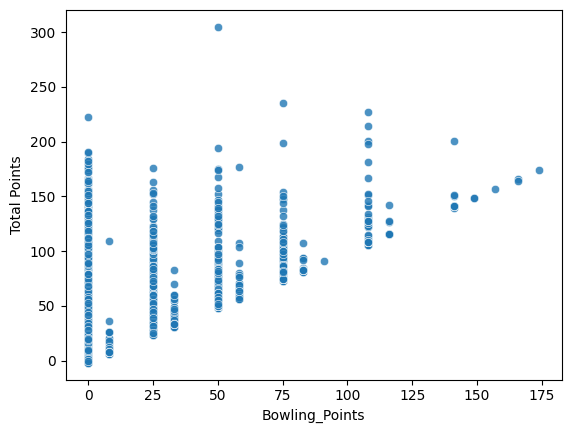

In [8]:
sns.scatterplot(data=train, y='Total Points', x='Bowling_Points', sizes=(20,150), alpha=0.8, legend=False)

In [9]:
# # displaying specific or mentioned columns
# columns = ['Match_ID','Player_Name','Total Points', 'Runs', 'Batting_Points', 'Bowling_Points']
# train = train[columns]
# train.head()

In [10]:
#adding another csv file and reading the data
ipl_previous = pd.read_csv("Matches IPL 2008-2019.csv")
ipl_previous

,match_id,season,city,date,team1,team2,toss_winner,toss_decision,result,dl_applied,winner,win_by_runs,win_by_wickets,player_of_match,venue,umpire1,umpire2,umpire3
0,60,2008,Bangalore,18-04-2008,Kolkata Knight Riders,Royal Challengers Bangalore,Royal Challengers Bangalore,field,normal,0,Kolkata Knight Riders,140,0,BB McCullum,M Chinnaswamy Stadium,Asad Rauf,RE Koertzen,NaN
1,61,2008,Chandigarh,19-04-2008,Chennai Super Kings,Kings XI Punjab,Chennai Super Kings,bat,normal,0,Chennai Super Kings,33,0,MEK Hussey,"Punjab Cricket Association Stadium, Mohali",MR Benson,SL Shastri,NaN
2,62,2008,Delhi,19-04-2008,Rajasthan Royals,Delhi Daredevils,Rajasthan Royals,bat,normal,0,Delhi Daredevils,0,9,MF Maharoof,Feroz Shah Kotla,Aleem Dar,GA Pratapkumar,NaN
3,63,2008,Mumbai,20-04-2008,Mumbai Indians,Royal Challengers Bangalore,Mumbai Indians,bat,normal,0,Royal Challengers Bangalore,0,5,MV Boucher,Wankhede Stadium,SJ Davis,DJ Harper,NaN
4,64,2008,Kolkata,20-04-2008,Deccan Chargers,Kolkata Knight Riders,Deccan Chargers,bat,normal,0,Kolkata Knight Riders,0,5,DJ Hussey,Eden Gardens,BF Bowden,K Hariharan,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
751,11347,2019,Mumbai,5/5/2019,Kolkata Knight Riders,Mumbai Indians,Mumbai Indians,field,normal,0,Mumbai Indians,0,9,HH Pandya,Wankhede Stadium,Nanda Kishore,O Nandan,S Ravi
752,11412,2019,Chennai,7/5/2019,Chennai Super Kings,Mumbai Indians,Chennai Super Kings,bat,normal,0,Mumbai Indians,0,6,AS Yadav,M. A. Chidambaram Stadium,Nigel Llong,Nitin Menon,Ian Gould
753,11413,2019,Visakhapatnam,8/5/2019,Sunrisers Hyderabad,Delhi Capitals,Delhi Capitals,field,normal,0,Delhi Capitals,0,2,RR Pant,ACA-VDCA Stadium,NaN,NaN,NaN
754,11414,2019,Visakhapatnam,10/5/2019,Delhi Capitals,Chennai Super Kings,Chennai Super Kings,field,normal,0,Chennai Super Kings,0,6,F du Plessis,ACA-VDCA Stadium,Sundaram Ravi,Bruce Oxenford,Chettithody Shamshuddin


# Checking null values

In [11]:
#number of null values in each column
ipl_previous.isna().sum()

match_id             0
season               0
city                 7
date                 0
team1                0
team2                0
toss_winner          0
toss_decision        0
result               0
dl_applied           0
winner               4
win_by_runs          0
win_by_wickets       0
player_of_match      4
venue                0
umpire1              2
umpire2              2
umpire3            637
dtype: int64

In [12]:
ipl_previous.loc[:,['city','winner','player_of_match', 'umpire1', 'umpire2', 'umpire3']].info()

#replacing the values of null fields
ipl_previous.city.fillna('-', inplace=True)
ipl_previous.winner.fillna(0, inplace=True)
ipl_previous.player_of_match.fillna(0, inplace=True)
ipl_previous.umpire1.fillna(0, inplace=True)
ipl_previous.umpire2.fillna(0, inplace=True)
ipl_previous.umpire3.fillna(0, inplace=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 756 entries, 0 to 755
Data columns (total 6 columns):
 #   Column           Non-Null Count  Dtype 
---  ------           --------------  ----- 
 0   city             749 non-null    object
 1   winner           752 non-null    object
 2   player_of_match  752 non-null    object
 3   umpire1          754 non-null    object
 4   umpire2          754 non-null    object
 5   umpire3          119 non-null    object
dtypes: object(6)
memory usage: 35.6+ KB


In [13]:
ipl_previous.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 756 entries, 0 to 755
Data columns (total 18 columns):
 #   Column           Non-Null Count  Dtype 
---  ------           --------------  ----- 
 0   match_id         756 non-null    int64 
 1   season           756 non-null    int64 
 2   city             756 non-null    object
 3   date             756 non-null    object
 4   team1            756 non-null    object
 5   team2            756 non-null    object
 6   toss_winner      756 non-null    object
 7   toss_decision    756 non-null    object
 8   result           756 non-null    object
 9   dl_applied       756 non-null    int64 
 10  winner           756 non-null    object
 11  win_by_runs      756 non-null    int64 
 12  win_by_wickets   756 non-null    int64 
 13  player_of_match  756 non-null    object
 14  venue            756 non-null    object
 15  umpire1          756 non-null    object
 16  umpire2          756 non-null    object
 17  umpire3          756 non-null    ob

In [14]:
profile_ipl = ProfileReport(ipl_previous, title='ipl_previous_seasons')
profile_ipl.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [15]:
#displaying distinct values of season column
ipl_previous.season.unique()

array([2008, 2009, 2010, 2011, 2012, 2013, 2014, 2015, 2016, 2017, 2018,
       2019], dtype=int64)

# Extracting player of Match

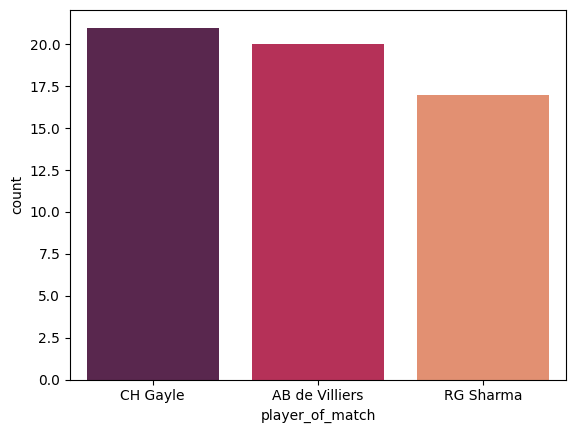

In [16]:
#number of player of match won by each player
sns.countplot(x="player_of_match", data= ipl_previous, palette="rocket",order= ipl_previous.player_of_match.value_counts().iloc[:3].index)
plt.show()

# All Previous Season 

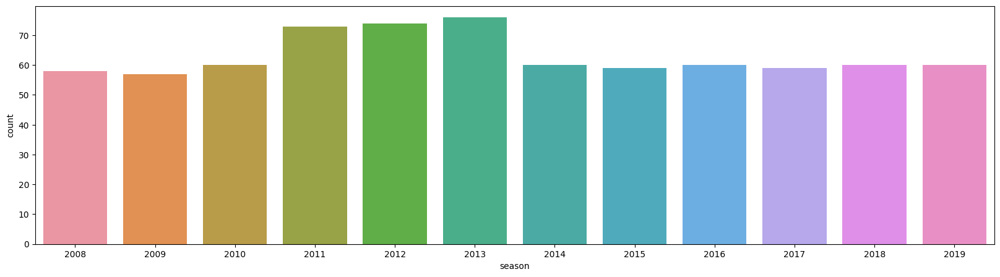

In [17]:
fig_dims=(20,5)

#total number of matches each season
plt.subplots(figsize=fig_dims)
sns.countplot(x= ipl_previous['season'],data= ipl_previous)
plt.show()

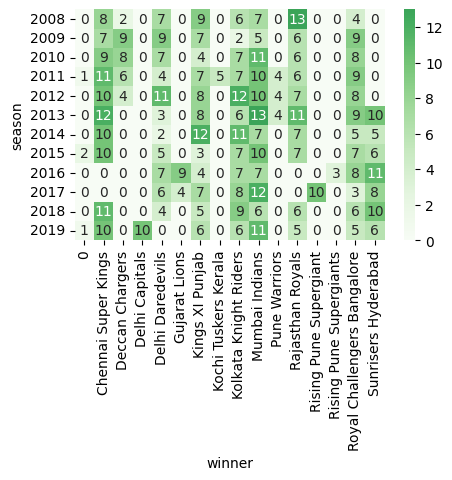

In [18]:
train_2 = ipl_previous[ipl_previous['dl_applied']==0].pivot_table(index='season', values='toss_winner', columns='winner', aggfunc=len, fill_value=0)
train_2.index = pd.CategoricalIndex(train_2.index, categories=[2008, 2009, 2010, 2011, 2012, 2013, 2014, 2015, 2016, 2017, 2018, 2019], ordered=True)
train_2 = train_2.sort_index()

# We create a mask array to hide certain cells in the heatmap. The mask is a 2D array where 1 represents visible cells and 0 represents hidden cells

mask = train_2 < 15

# Apply the mask to the DataFrame
masked_df = train_2.mask(mask)

# create a figure and axis object using plt.subplots and specify the size of the heatmap
f, ax = plt.subplots(figsize=(5, 3))

# We pass the bookings pivot table as the data, set the center value to 2000 for color scaling, enable annotations, apply the mask,
# format the cell values as integers, specify the axis object, and choose the color map.
sns.heatmap(train_2, center=10, annot=True, mask=masked_df, fmt="d", ax=ax, cmap="Greens")
sns.set_context('paper')
plt.show()

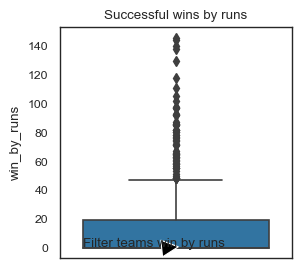

In [19]:
#adjusting the size of figure
plt.figure(figsize=(3,3))
sns.set_style("white")

#creating boxplot and using dataframe --> booking_country, and data of cancellation rate
sns.boxplot(data=ipl_previous, y='win_by_runs')

#annoting in the figure and explaining through the text mentioned
plt.annotate('Filter teams win by runs', xy=(0.01, 0.48), xytext=(-0.4, 0.8), arrowprops=dict(facecolor='black', shrink=1))
plt.title('Successful wins by runs')
plt.show()

Above heatmap shows the team which has won the toss and even the match.

# Previous Season Winners

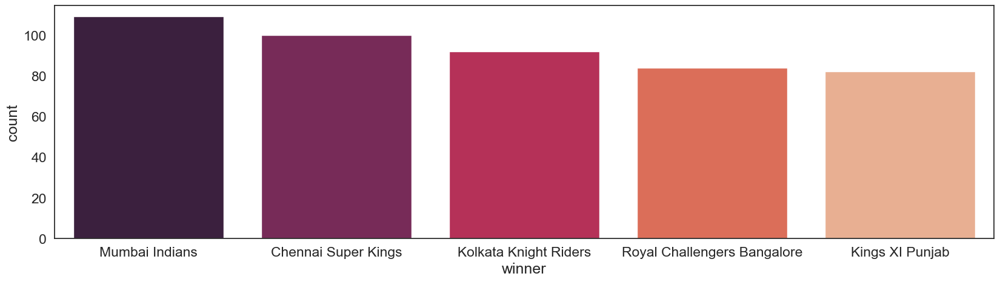

In [20]:
fig_dims=(20,5)
sns.set(font_scale=1.5)
sns.set_style("white")
plt.subplots(figsize=fig_dims)

# number of players belonging to the winning team
sns.countplot(x=ipl_previous["winner"],palette="rocket", data= ipl_previous, order=ipl_previous.winner.value_counts().iloc[:5].index)
plt.show()

In [21]:
#number of times the names are repeated in the data
train['Player_Name'].value_counts()

Player_Name
SK Raina         189
RG Sharma        183
MS Dhoni         170
V Kohli          170
RV Uthappa       170
                ... 
AA Kazi            1
I Malhotra         1
BJ Haddin          1
NJ Rimmington      1
S Singh            1
Name: count, Length: 559, dtype: int64

In [22]:
#reading third csv file which has data about the ipl season 2020

match20 = pd.read_csv("Matches IPL 2020.csv",header=0)
match20

,match_id,city,date,team1,team2,venue,umpire1,umpire2,umpire3
0,1216492,Abu Dhabi,9/19/2020,MI,CSK,"Sheikh Zayed Stadium, Abu Dhabi",Chris Gaffaney,Virender Sharma,Sundaram Ravi
1,1216493,Dubai (DSC),9/20/2020,DC,KXIP,Dubai International Cricket Stadium,Anil Chaudhary,Nitin Menon,Paul Reiffel
2,1216534,Dubai (DSC),9/21/2020,SRH,RCB,Dubai International Cricket Stadium,Anil Dandekar,Nitin Menon,Anil Chaudhary
3,1216496,Sharjah,9/22/2020,RR,CSK,Sharjah Cricket Stadium,Chettithody Shamshuddin,Vineet Kulkarni,KN Ananthapadmanabhan
4,1216508,Abu Dhabi,9/23/2020,KKR,MI,"Sheikh Zayed Stadium, Abu Dhabi",Chris Gaffaney,Sundaram Ravi,Virender Sharma
5,1216510,Dubai (DSC),9/24/2020,KXIP,RCB,Dubai International Cricket Stadium,Anil Chaudhary,Paul Reiffel,Nitin Menon
6,1216539,Dubai (DSC),9/25/2020,CSK,DC,Dubai International Cricket Stadium,KN Ananthapadmanabhan,Richard Illingworth,Krishnamachari Srinivasan
7,1216545,Abu Dhabi,9/26/2020,KKR,SRH,"Sheikh Zayed Stadium, Abu Dhabi",Chris Gaffaney,Virender Sharma,Sundaram Ravi
8,1216527,Sharjah,9/27/2020,RR,KXIP,Sharjah Cricket Stadium,Richard Illingworth,Krishnamachari Srinivasan,Chettithody Shamshuddin
9,1216547,Dubai (DSC),9/28/2020,RCB,MI,Dubai International Cricket Stadium,Nitin Menon,Paul Reiffel,Anil Chaudhary


In [23]:
ipl_previous

,match_id,season,city,date,team1,team2,toss_winner,toss_decision,result,dl_applied,winner,win_by_runs,win_by_wickets,player_of_match,venue,umpire1,umpire2,umpire3
0,60,2008,Bangalore,18-04-2008,Kolkata Knight Riders,Royal Challengers Bangalore,Royal Challengers Bangalore,field,normal,0,Kolkata Knight Riders,140,0,BB McCullum,M Chinnaswamy Stadium,Asad Rauf,RE Koertzen,0
1,61,2008,Chandigarh,19-04-2008,Chennai Super Kings,Kings XI Punjab,Chennai Super Kings,bat,normal,0,Chennai Super Kings,33,0,MEK Hussey,"Punjab Cricket Association Stadium, Mohali",MR Benson,SL Shastri,0
2,62,2008,Delhi,19-04-2008,Rajasthan Royals,Delhi Daredevils,Rajasthan Royals,bat,normal,0,Delhi Daredevils,0,9,MF Maharoof,Feroz Shah Kotla,Aleem Dar,GA Pratapkumar,0
3,63,2008,Mumbai,20-04-2008,Mumbai Indians,Royal Challengers Bangalore,Mumbai Indians,bat,normal,0,Royal Challengers Bangalore,0,5,MV Boucher,Wankhede Stadium,SJ Davis,DJ Harper,0
4,64,2008,Kolkata,20-04-2008,Deccan Chargers,Kolkata Knight Riders,Deccan Chargers,bat,normal,0,Kolkata Knight Riders,0,5,DJ Hussey,Eden Gardens,BF Bowden,K Hariharan,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
751,11347,2019,Mumbai,5/5/2019,Kolkata Knight Riders,Mumbai Indians,Mumbai Indians,field,normal,0,Mumbai Indians,0,9,HH Pandya,Wankhede Stadium,Nanda Kishore,O Nandan,S Ravi
752,11412,2019,Chennai,7/5/2019,Chennai Super Kings,Mumbai Indians,Chennai Super Kings,bat,normal,0,Mumbai Indians,0,6,AS Yadav,M. A. Chidambaram Stadium,Nigel Llong,Nitin Menon,Ian Gould
753,11413,2019,Visakhapatnam,8/5/2019,Sunrisers Hyderabad,Delhi Capitals,Delhi Capitals,field,normal,0,Delhi Capitals,0,2,RR Pant,ACA-VDCA Stadium,0,0,0
754,11414,2019,Visakhapatnam,10/5/2019,Delhi Capitals,Chennai Super Kings,Chennai Super Kings,field,normal,0,Chennai Super Kings,0,6,F du Plessis,ACA-VDCA Stadium,Sundaram Ravi,Bruce Oxenford,Chettithody Shamshuddin


In [24]:
ipl_previous.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 756 entries, 0 to 755
Data columns (total 18 columns):
 #   Column           Non-Null Count  Dtype 
---  ------           --------------  ----- 
 0   match_id         756 non-null    int64 
 1   season           756 non-null    int64 
 2   city             756 non-null    object
 3   date             756 non-null    object
 4   team1            756 non-null    object
 5   team2            756 non-null    object
 6   toss_winner      756 non-null    object
 7   toss_decision    756 non-null    object
 8   result           756 non-null    object
 9   dl_applied       756 non-null    int64 
 10  winner           756 non-null    object
 11  win_by_runs      756 non-null    int64 
 12  win_by_wickets   756 non-null    int64 
 13  player_of_match  756 non-null    object
 14  venue            756 non-null    object
 15  umpire1          756 non-null    object
 16  umpire2          756 non-null    object
 17  umpire3          756 non-null    ob

In [25]:
teams = ipl_previous.team1.unique()
teams2 = match20.team1.unique()
print(teams)
print(teams2)


['Kolkata Knight Riders' 'Chennai Super Kings' 'Rajasthan Royals'
 'Mumbai Indians' 'Deccan Chargers' 'Kings XI Punjab'
 'Royal Challengers Bangalore' 'Delhi Daredevils' 'Kochi Tuskers Kerala'
 'Pune Warriors' 'Sunrisers Hyderabad' 'Rising Pune Supergiants'
 'Gujarat Lions' 'Rising Pune Supergiant' 'Delhi Capitals']
['MI' 'DC' 'SRH' 'RR' 'KKR' 'KXIP' 'CSK' 'RCB']


In [26]:
sort = { 'Kolkata Knight Riders':'KKR','Chennai Super Kings':'CSK','Rajasthan Royals':'RR',
         'Mumbai Indians':'MI','Deccan Chargers':'SRH','Kings XI Punjab':'KXIP',
         'Royal Challengers Bangalore':'RCB','Delhi Daredevils':'DC',
         'Sunrisers Hyderabad':'SRH','Delhi Capitals':'DC','Rising Pune Supergiants':'RPS',
         'Gujarat Lions':'GL','Rising Pune Supergiant':'RPS','Pune Warriors':'RPS',
         'Kochi Tuskers Kerala':'KTK'}


In [27]:
ipl_previous['team1'] = ipl_previous['team1'].map(sort) 
ipl_previous['team2'] = ipl_previous['team2'].map(sort)
ipl_previous['toss_winner'] = ipl_previous['toss_winner'].map(sort) 
ipl_previous['winner'] = ipl_previous['winner'].map(sort) 
ipl_previous

,match_id,season,city,date,team1,team2,toss_winner,toss_decision,result,dl_applied,winner,win_by_runs,win_by_wickets,player_of_match,venue,umpire1,umpire2,umpire3
0,60,2008,Bangalore,18-04-2008,KKR,RCB,RCB,field,normal,0,KKR,140,0,BB McCullum,M Chinnaswamy Stadium,Asad Rauf,RE Koertzen,0
1,61,2008,Chandigarh,19-04-2008,CSK,KXIP,CSK,bat,normal,0,CSK,33,0,MEK Hussey,"Punjab Cricket Association Stadium, Mohali",MR Benson,SL Shastri,0
2,62,2008,Delhi,19-04-2008,RR,DC,RR,bat,normal,0,DC,0,9,MF Maharoof,Feroz Shah Kotla,Aleem Dar,GA Pratapkumar,0
3,63,2008,Mumbai,20-04-2008,MI,RCB,MI,bat,normal,0,RCB,0,5,MV Boucher,Wankhede Stadium,SJ Davis,DJ Harper,0
4,64,2008,Kolkata,20-04-2008,SRH,KKR,SRH,bat,normal,0,KKR,0,5,DJ Hussey,Eden Gardens,BF Bowden,K Hariharan,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
751,11347,2019,Mumbai,5/5/2019,KKR,MI,MI,field,normal,0,MI,0,9,HH Pandya,Wankhede Stadium,Nanda Kishore,O Nandan,S Ravi
752,11412,2019,Chennai,7/5/2019,CSK,MI,CSK,bat,normal,0,MI,0,6,AS Yadav,M. A. Chidambaram Stadium,Nigel Llong,Nitin Menon,Ian Gould
753,11413,2019,Visakhapatnam,8/5/2019,SRH,DC,DC,field,normal,0,DC,0,2,RR Pant,ACA-VDCA Stadium,0,0,0
754,11414,2019,Visakhapatnam,10/5/2019,DC,CSK,CSK,field,normal,0,CSK,0,6,F du Plessis,ACA-VDCA Stadium,Sundaram Ravi,Bruce Oxenford,Chettithody Shamshuddin


In [28]:
ipl_previous.rename(columns = {'match_id':'Match_ID'}, inplace = True) 


In [29]:
train_m = pd.merge(train[['Match_ID','Player_Name','Total Points']], ipl_previous[['Match_ID','team1','team2']], on = 'Match_ID', how='inner')
train_m

,Match_ID,Player_Name,Total Points,team1,team2
0,1,Bipul Sharma,25,SRH,RCB
1,1,DJ Hooda,44,SRH,RCB
2,1,KM Jadhav,38,SRH,RCB
3,1,Mandeep Singh,29,SRH,RCB
4,1,Yuvraj Singh,86,SRH,RCB
...,...,...,...,...,...
15911,11415,RA Jadeja,10,MI,CSK
15912,11415,Harbhajan Singh,0,MI,CSK
15913,11415,RG Sharma,19,MI,CSK
15914,11415,SN Thakur,52,MI,CSK


In [30]:
match20.rename(columns = {'match_id':'Match_ID'}, inplace = True) 
match20.head()


,Match_ID,city,date,team1,team2,venue,umpire1,umpire2,umpire3
0,1216492,Abu Dhabi,9/19/2020,MI,CSK,"Sheikh Zayed Stadium, Abu Dhabi",Chris Gaffaney,Virender Sharma,Sundaram Ravi
1,1216493,Dubai (DSC),9/20/2020,DC,KXIP,Dubai International Cricket Stadium,Anil Chaudhary,Nitin Menon,Paul Reiffel
2,1216534,Dubai (DSC),9/21/2020,SRH,RCB,Dubai International Cricket Stadium,Anil Dandekar,Nitin Menon,Anil Chaudhary
3,1216496,Sharjah,9/22/2020,RR,CSK,Sharjah Cricket Stadium,Chettithody Shamshuddin,Vineet Kulkarni,KN Ananthapadmanabhan
4,1216508,Abu Dhabi,9/23/2020,KKR,MI,"Sheikh Zayed Stadium, Abu Dhabi",Chris Gaffaney,Sundaram Ravi,Virender Sharma


In [31]:
submission = pd.read_csv("sample_submission.csv",header=0)
submission['Match_ID'] = submission['Id']
submission['Player'] = submission['Id']
for i in range(0, len( submission)):
    submission['Player'][i] =  submission['Id'][i].split("_")[-1]
    submission['Match_ID'][i] = int( submission['Id'][i].split('_')[:1][0])


# Concating Two datasets w.r.t Matach ID

In [32]:
submit_m = pd.merge(submission[['Match_ID','Player','Total Points']], match20[['Match_ID','team1','team2']], on = 'Match_ID', how='inner')


In [33]:

all_added = pd.concat([train_m,submit_m]) 
all_added.info()


<class 'pandas.core.frame.DataFrame'>
Index: 17199 entries, 0 to 1282
Data columns (total 6 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Match_ID      17199 non-null  object
 1   Player_Name   15916 non-null  object
 2   Total Points  17199 non-null  int64 
 3   team1         17199 non-null  object
 4   team2         17199 non-null  object
 5   Player        1283 non-null   object
dtypes: int64(1), object(5)
memory usage: 940.6+ KB


# Average Scores of Every Player

In [34]:
#calculating the average score of each player and resetting thier index
Avg_scores = all_added.groupby('Player')['Total Points'].mean().reset_index()

#changing column name from Total points to Avg
Avg_scores.rename(columns = {'Total Points':'Avg'}, inplace = True)
Avg_scores

,Player,Avg
0,A Mishra,0.0
1,A Zampa,0.0
2,AB de Villiers,0.0
3,AD Russell,0.0
4,AJ Finch,0.0
...,...,...
153,WP Saha,0.0
154,Washington Sundar,0.0
155,YBK Jaiswal,0.0
156,YS Chahal,0.0


In [35]:
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier as KNN
from sklearn.ensemble import VotingClassifier, BaggingClassifier, RandomForestClassifier, AdaBoostClassifier
from sklearn.metrics import roc_auc_score

In [36]:
from sklearn.preprocessing import LabelEncoder

# Create a LabelEncoder object
label_encoder = LabelEncoder()

selected_columns = train[['Runs', 'Boundaries', 'Wickets', 'Hundred', 'Batting_Points', 'Bowling_Points', 'Total Points', 'Six', 'Duck', '4W_Haul', '5W_Haul', 'Maidens', 'Fifty', 'Player_Name']]
selected_columns['Player_Name'] = LabelEncoder().fit_transform(selected_columns['Player_Name'])
selected_columns.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 15916 entries, 0 to 15915
Data columns (total 14 columns):
 #   Column          Non-Null Count  Dtype
---  ------          --------------  -----
 0   Runs            15916 non-null  int64
 1   Boundaries      15916 non-null  int64
 2   Wickets         15916 non-null  int64
 3   Hundred         15916 non-null  int64
 4   Batting_Points  15916 non-null  int64
 5   Bowling_Points  15916 non-null  int64
 6   Total Points    15916 non-null  int64
 7   Six             15916 non-null  int64
 8   Duck            15916 non-null  int64
 9   4W_Haul         15916 non-null  int64
 10  5W_Haul         15916 non-null  int64
 11  Maidens         15916 non-null  int64
 12  Fifty           15916 non-null  int64
 13  Player_Name     15916 non-null  int32
dtypes: int32(1), int64(13)
memory usage: 1.6 MB


In [37]:
selected_columns.rename(columns={'4W_Haul': 'Four_W_Haul'}, inplace=True)
selected_columns.rename(columns={'5W_Haul': 'Five_W_Haul'}, inplace=True)

In [38]:
# seasons_data = train[['Match_ID','Player_Name','Total Points', 'Runs', 'Batting_Points', 'Bowling_Points']]

# booking_data_dummies, which contains the original data along with the newly created dummy variables
# season_data_dummies=pd.get_dummies(data=seasons_data, columns=['team1','date', 'team2', 'umpire1', 'umpire2', 'umpire3'])
# print(season_data_dummies.shape)

In [39]:
# We drop the 'city' column from the dataset
# train_data_selected = train_data[selected_columns]
X = selected_columns.drop(['Total_Points'], axis=1)

# 'city' column is assigned to the variable y, which represents the target variable we want to predict
y = selected_columns['Total_Points']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.4, random_state=6)

In [40]:
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.tree import DecisionTreeClassifier

steps = [
    ('scaler', StandardScaler()),  # StandardScaler as the first step
    ('decision_tree', DecisionTreeClassifier(
        criterion='entropy',  # or 'entropy' for information gain
        splitter='best',   # or 'random' for random split
        max_depth=None,    # None means nodes are expanded until all leaves are pure
        min_samples_split=2,
        min_samples_leaf=1,
        max_features=None,  # Number of features to consider when looking for the best split
        random_state=None,
        max_leaf_nodes=None,  # If None then unlimited number of leaf nodes
        min_impurity_decrease=0.0,
        class_weight=None,
        ccp_alpha=0.0
    ))  # DecisionTreeClassifier as the second step
]

pipe1 = Pipeline(steps)


In [41]:
pipe1.fit(X_train,y_train)

Pipeline(steps=[('scaler', StandardScaler()),
                ('decision_tree', DecisionTreeClassifier(criterion='entropy'))])

In [42]:
y_prd=pipe1.predict(X_test)

In [43]:
from sklearn.metrics import accuracy_score
accuracy_score(y_test,y_prd)

0.9711009894769908

In [44]:
import pickle
pickle.dump(pipe1,open('pipe1.pkl','wb'))
pickle.dump(selected_columns,open('df.pkl','wb'))

In [45]:
X_test.head()

,Runs,Boundaries,Wickets,Hundred,Bowling_Points,Total Points,Six,Duck,Four_W_Haul,Five_W_Haul,Maidens,Fifty,Player_Name
10267,1,0,0,0,0,1,0,0,0,0,0,0,274
8066,7,0,0,0,0,7,0,0,0,0,0,0,57
12174,0,0,0,0,0,0,0,0,0,0,0,0,513
8120,16,2,0,0,0,20,1,0,0,0,0,0,126
14234,25,4,1,0,25,60,3,0,0,0,0,0,81


In [46]:
X_test[X_test['Hundred'] > 0]

,Runs,Boundaries,Wickets,Hundred,Bowling_Points,Total Points,Six,Duck,Four_W_Haul,Five_W_Haul,Maidens,Fifty,Player_Name
2019,115,18,0,1,0,163,7,0,0,0,0,0,460
8590,175,30,2,1,50,305,17,0,0,0,0,0,100
1512,109,19,0,1,0,164,10,0,0,0,0,0,31
15542,101,16,0,1,0,151,9,0,0,0,0,0,235
5845,107,19,3,1,75,235,9,0,0,0,0,0,100
11953,104,14,2,1,50,194,5,0,0,0,0,0,479
15486,108,14,0,1,0,144,3,0,0,0,0,0,45
14843,100,15,0,1,0,137,3,0,0,0,0,0,355
2017,114,20,0,1,0,172,11,0,0,0,0,0,486
12999,109,14,0,1,0,155,8,0,0,0,0,0,529


In [47]:
X_test[X_test['Fifty'] > 0]

,Runs,Boundaries,Wickets,Hundred,Bowling_Points,Total Points,Six,Duck,Four_W_Haul,Five_W_Haul,Maidens,Fifty,Player_Name
12592,63,10,0,0,0,83,1,0,0,0,0,1,143
7128,55,8,0,0,0,71,0,0,0,0,0,1,141
13250,54,6,0,0,0,68,0,0,0,0,0,1,529
12392,74,9,0,0,0,91,0,0,0,0,0,1,121
10858,98,16,0,0,0,130,4,0,0,0,0,1,396
...,...,...,...,...,...,...,...,...,...,...,...,...,...
15385,59,6,0,0,0,75,1,0,0,0,0,1,477
639,71,11,0,0,0,90,0,0,0,0,0,1,156
9234,55,6,0,0,0,69,0,0,0,0,0,1,282
11705,54,8,0,0,0,74,2,0,0,0,0,1,423


In [48]:
X_test.shape

(6367, 13)

In [49]:
sdgs

NameError: name 'sdgs' is not defined

In [ ]:
3rr3e# Create an instance of the DecisionTreeClassifier class
model_t = DecisionTreeClassifier(criterion='entropy', random_state=7)

# X_train represents the features and y_train represents the corresponding labels
model_t.fit(X_train, y_train)
y_pred = model_t.predict(X_test)
print('Score :', accuracy_score(y_test, y_pred))

In [ ]:
# creating the model and setting the number of K-neighbours to 4.
model_k = KNN(n_neighbors=4)

# fitting the KNN-model to training sets
model_k.fit(X_train, y_train)
y_pred = model_k.predict(X_test)
print('Score :', accuracy_score(y_test, y_pred))

In [ ]:
# Creating model for logistic regression and  the solver parameter is used to specify the algorithm to be used for optimization.
# It determines how the model finds the optimal weights during the training process.
model_l = LogisticRegression(random_state=7, solver='liblinear')
model_l.fit(X_train, y_train)
y_pred = model_l.predict(X_test)
print('Score :', accuracy_score(y_test, y_pred))

In [ ]:
# The classifiers variable is a list of tuples
classifiers = [('Logistic Regression', model_l), ('K Nearest Neighbours', model_k), ('Classification Tree', model_t)]
vc = VotingClassifier(estimators=classifiers)
vc.fit(X_train, y_train)
y_pred = vc.predict(X_test)
print('Voting Classifier: {:.3f}'.format(accuracy_score(y_test, y_pred)))

In [ ]:
#creating instance of random forest and setting the no. of estimators to 400 and random state to 7
rf = RandomForestClassifier(n_estimators=400, random_state=7)
rf.fit(X_train, y_train)
y_pred = rf.predict(X_test)
accuracy = accuracy_score(y_test, y_pred)

In [ ]:
print('Accuracy of Random Forest Classifier: {:.3f}'.format(accuracy))